Importing necessary packages

In [ ]:
import numpy as np
import pandas as pd
from google.colab import files
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from tensorflow.python import keras
from tensorflow.python.keras.models import Sequential
from tensorflow.python.keras.layers import Dense, Flatten, Conv2D, Dropout, MaxPooling2D,LSTM,Dropout,BatchNormalization
from IPython.display import SVG
from keras.utils.vis_utils import model_to_dot
from keras.utils.vis_utils import plot_model
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline 
import plotly.graph_objs as go
import plotly.figure_factory as ff
from plotly import tools
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

In [ ]:
train_data=pd.read_csv('/content/drive/MyDrive/fashion-mnist_train.csv')

In [ ]:
test_data=pd.read_csv('/content/drive/MyDrive/fashion-mnist_test.csv')

Defining the class labels

In [ ]:
labels = {0 : "T-shirt/top", 1: "Trouser", 2: "Pullover", 3: "Dress", 4: "Coat",
          5: "Sandal", 6: "Shirt", 7: "Sneaker", 8: "Bag", 9: "Ankle Boot"}

In [ ]:
train_data.head()

,label,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,pixel11,pixel12,pixel13,pixel14,pixel15,pixel16,pixel17,pixel18,pixel19,pixel20,pixel21,pixel22,pixel23,pixel24,pixel25,pixel26,pixel27,pixel28,pixel29,pixel30,pixel31,pixel32,pixel33,pixel34,pixel35,pixel36,pixel37,pixel38,pixel39,...,pixel745,pixel746,pixel747,pixel748,pixel749,pixel750,pixel751,pixel752,pixel753,pixel754,pixel755,pixel756,pixel757,pixel758,pixel759,pixel760,pixel761,pixel762,pixel763,pixel764,pixel765,pixel766,pixel767,pixel768,pixel769,pixel770,pixel771,pixel772,pixel773,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,6,0,0,0,0,0,0,0,5,0,0,0,105,92,101,107,100,132,0,0,2,4,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,150,...,211,220,214,74,0,255,222,128,0,0,0,0,0,0,0,0,0,44,12,0,0,40,134,162,191,214,163,146,165,79,0,0,0,30,43,0,0,0,0,0
3,0,0,0,0,1,2,0,0,0,0,0,114,183,112,55,23,72,102,165,160,28,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,24,188,163,93,...,171,249,207,197,202,45,0,3,0,0,0,0,0,0,0,0,0,0,1,0,0,0,22,21,25,69,52,45,74,39,3,0,0,0,0,1,0,0,0,0
4,3,0,0,0,0,0,0,0,0,0,0,0,0,46,0,21,68,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,25,187,189,...,230,237,229,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,68,116,112,136,147,144,121,102,63,0,0,0,0,0,0,0,0,0,0


In [ ]:
test_data.head()

,label,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,pixel11,pixel12,pixel13,pixel14,pixel15,pixel16,pixel17,pixel18,pixel19,pixel20,pixel21,pixel22,pixel23,pixel24,pixel25,pixel26,pixel27,pixel28,pixel29,pixel30,pixel31,pixel32,pixel33,pixel34,pixel35,pixel36,pixel37,pixel38,pixel39,...,pixel745,pixel746,pixel747,pixel748,pixel749,pixel750,pixel751,pixel752,pixel753,pixel754,pixel755,pixel756,pixel757,pixel758,pixel759,pixel760,pixel761,pixel762,pixel763,pixel764,pixel765,pixel766,pixel767,pixel768,pixel769,pixel770,pixel771,pixel772,pixel773,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
0,0,0,0,0,0,0,0,0,9,8,0,0,34,29,7,0,11,24,0,0,3,3,1,0,1,1,0,0,0,0,0,4,0,0,1,0,0,0,0,0,...,242,245,224,245,234,0,3,0,0,0,0,0,0,0,0,0,0,0,0,37,69,94,123,127,138,138,142,145,135,125,103,87,56,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,0,0,209,190,181,150,170,193,180,219,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,24,...,248,238,80,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,174,233,155,0,65,235,216,34,0,0,0,0,0,0,0,0,0
2,2,0,0,0,0,0,0,14,53,99,17,0,0,0,0,0,0,0,0,12,94,68,14,0,0,0,0,0,0,0,0,0,0,0,38,106,94,89,94,68,...,0,0,0,0,0,0,87,12,26,0,0,0,0,0,0,0,46,50,29,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,63,53,31,0,0,0
3,2,0,0,0,0,0,0,0,0,0,161,212,138,150,169,164,176,202,255,183,26,0,0,0,0,0,0,0,0,0,0,0,1,0,0,129,221,255,255,215,...,255,255,254,252,255,101,196,254,252,100,0,0,0,0,0,168,232,225,0,41,172,147,148,153,155,146,137,141,143,137,137,126,140,0,133,224,222,56,0,0
4,3,0,0,0,0,0,0,0,0,0,0,37,0,0,0,0,0,0,17,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,21,204,235,...,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,2,69,0,2,0,0,0,0,0,0,0,0,0,0


Functions for finding and plotting the class distribution

In [ ]:
def get_classes_distribution(data):
    label_counts = data["label"].value_counts()
    total_samples = len(data)
    for i in range(len(label_counts)):
        label = labels[label_counts.index[i]]
        count = label_counts.values[i]
        percent = (count / total_samples) * 100
        print("{:<20s}:   {} or {}%".format(label, count, percent))

In [ ]:
def plot_label_per_class(data):
    f, ax = plt.subplots(1,1, figsize=(12,4))
    g = sns.countplot(data.label, order = data["label"].value_counts().index)
    g.set_title("Number of labels for each class")

    for p, label in zip(g.patches, data["label"].value_counts().index):
        g.annotate(labels[label], (p.get_x(), p.get_height()+0.1))
    plt.show()  
    

Distribution of images for each class label for train and test data

In [ ]:
get_classes_distribution(train_data)

Ankle Boot          :   6000 or 10.0%
Bag                 :   6000 or 10.0%
Sneaker             :   6000 or 10.0%
Shirt               :   6000 or 10.0%
Sandal              :   6000 or 10.0%
Coat                :   6000 or 10.0%
Dress               :   6000 or 10.0%
Pullover            :   6000 or 10.0%
Trouser             :   6000 or 10.0%
T-shirt/top         :   6000 or 10.0%


In [ ]:
get_classes_distribution(test_data)

Sneaker             :   1000 or 10.0%
Shirt               :   1000 or 10.0%
Sandal              :   1000 or 10.0%
Coat                :   1000 or 10.0%
Dress               :   1000 or 10.0%
Pullover            :   1000 or 10.0%
Ankle Boot          :   1000 or 10.0%
Trouser             :   1000 or 10.0%
Bag                 :   1000 or 10.0%
T-shirt/top         :   1000 or 10.0%


Visualising the class distribution

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



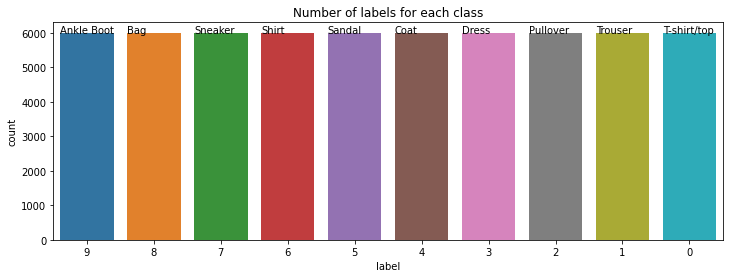

In [ ]:
plot_label_per_class(train_data)

Function to split the dataset into images and labels

In [ ]:
IMG_ROWS = 28
IMG_COLS = 28
NUM_CLASSES = 10
def sample_images_data(data):
    sample_images = []
    sample_labels = []
    for k in labels.keys():
        samples = data[data["label"] == k].head(4)
        for j, s in enumerate(samples.values):
            img = np.array(samples.iloc[j, 1:]).reshape(IMG_ROWS,IMG_COLS)
            sample_images.append(img)
            sample_labels.append(samples.iloc[j, 0])
    return sample_images, sample_labels

In [ ]:
def plot_sample_images(data_sample_images,data_sample_labels,cmap="Blues"):
    f, ax = plt.subplots(5,8, figsize=(16,10))
    for i, img in enumerate(data_sample_images):
        ax[i//8, i%8].imshow(img, cmap=cmap)
        ax[i//8, i%8].axis('off')
        ax[i//8, i%8].set_title(labels[data_sample_labels[i]])
    plt.show()

In [ ]:
train_images, train_labels = sample_images_data(train_data)

In [ ]:
test_images, test_labels = sample_images_data(train_data)

Some of the images of the different cloths with their class labels

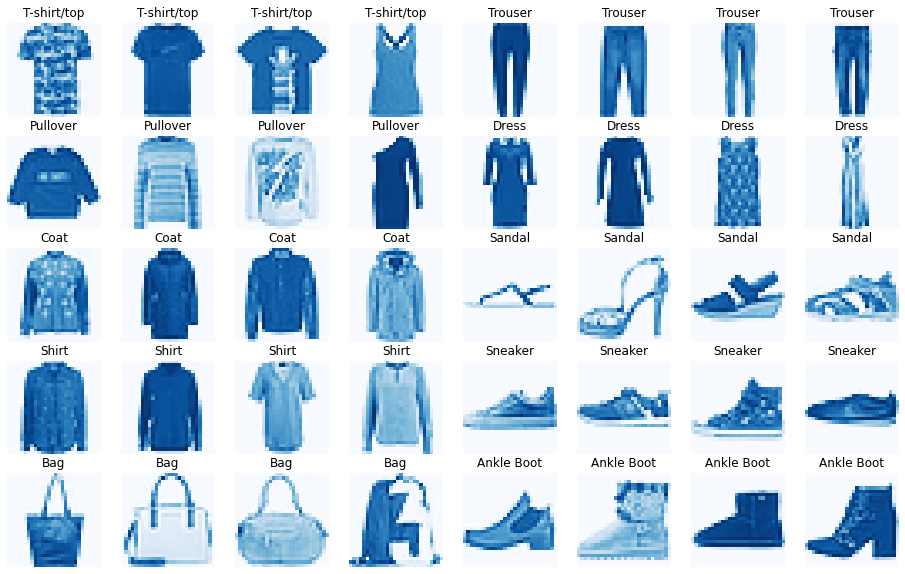

In [ ]:
plot_sample_images(train_images,train_labels, "Blues")

Function for preprocessing the dataset

 1) To convert the dataset with the labels as categorical 

 2) To reshape the images to define 1 more dimension to fit the CNN model

In [ ]:
from keras.utils import np_utils

In [ ]:

def data_preprocessing(raw):
    out_y = keras.utils.np_utils.to_categorical(raw.label, NUM_CLASSES)
    num_images = raw.shape[0]
    x_as_array = raw.values[:,1:]
    x_shaped_array = x_as_array.reshape(num_images, IMG_ROWS, IMG_COLS, 1)
    out_x = x_shaped_array / 255
    return out_x, out_y

In [ ]:
X, y = data_preprocessing(train_data)
X_test, y_test = data_preprocessing(test_data)

Splitting Data for Training and Validation

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=2018)

In [ ]:
from keras.applications.vgg16 import VGG16
vgg= VGG16(weights=None,include_top=False,input_shape=(32, 32, 1))

Creating the CNN model

In [ ]:
model = Sequential()
model.add(Conv2D(32, kernel_size=(3, 3),
                 activation='relu',
                 kernel_initializer='he_normal',
                 input_shape=(IMG_ROWS, IMG_COLS, 1)))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(64, 
                 kernel_size=(3, 3), 
                 activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(Flatten())
model.add(BatchNormalization())
model.add(Dense(128,activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(NUM_CLASSES, activation='softmax'))


model.compile(loss=keras.losses.categorical_crossentropy,
              optimizer='adam',
              metrics=['accuracy'])

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 26, 26, 32)        320       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 13, 13, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 11, 11, 64)        18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 5, 5, 64)          0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 3, 3, 128)         73856     
_________________________________________________________________
flatten (Flatten)            (None, 1152)              0         
_________________________________________________________________
batch_normalization (BatchNo (None, 1152)              4

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping
early_stop = EarlyStopping(monitor='val_loss',patience=7)

In [ ]:

train_model = model.fit(X_train, y_train,
                  batch_size=128,
                  epochs=50,
                  verbose=1,
                  validation_data=(X_val, y_val),callbacks=[early_stop])

Epoch 1/50
375/375 [==============================] - 43s 112ms/step - loss: 0.5336 - accuracy: 0.8045 - val_loss: 0.3864 - val_accuracy: 0.8673
Epoch 2/50
375/375 [==============================] - 42s 111ms/step - loss: 0.3621 - accuracy: 0.8677 - val_loss: 0.3176 - val_accuracy: 0.8826
Epoch 3/50
375/375 [==============================] - 41s 111ms/step - loss: 0.3058 - accuracy: 0.8885 - val_loss: 0.3683 - val_accuracy: 0.8595
Epoch 4/50
375/375 [==============================] - 41s 111ms/step - loss: 0.2798 - accuracy: 0.8991 - val_loss: 0.4534 - val_accuracy: 0.8579
Epoch 5/50
375/375 [==============================] - 41s 110ms/step - loss: 0.2530 - accuracy: 0.9072 - val_loss: 0.2794 - val_accuracy: 0.8979
Epoch 6/50
375/375 [==============================] - 41s 111ms/step - loss: 0.2346 - accuracy: 0.9145 - val_loss: 0.2705 - val_accuracy: 0.9049
Epoch 7/50
375/375 [==============================] - 41s 111ms/step - loss: 0.2172 - accuracy: 0.9200 - val_loss: 0.2733 - val_ac

In [ ]:
score1 = model.evaluate(X_test, y_test, verbose=0)
print('Test loss:', score1[0])
print('Test accuracy:', score1[1])

Test loss: 0.27118468284606934
Test accuracy: 0.9136000275611877


In [ ]:
print("Accuracy of this model is:",0.913*100,"%")

Accuracy of this model is: 91.3 %


**Now building a model with 4 conv2D layers**

In [ ]:
nmodel = Sequential()
nmodel.add(Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=(28, 28, 1)))
nmodel.add(BatchNormalization())

nmodel.add(Conv2D(32, kernel_size=(3, 3), activation='relu'))
nmodel.add(BatchNormalization())
nmodel.add(MaxPooling2D(pool_size=(2, 2)))
nmodel.add(Dropout(0.25))

nmodel.add(Conv2D(64, kernel_size=(3, 3), activation='relu'))
nmodel.add(BatchNormalization())
nmodel.add(Dropout(0.25))

nmodel.add(Conv2D(128, kernel_size=(3, 3), activation='relu'))
nmodel.add(BatchNormalization())
nmodel.add(MaxPooling2D(pool_size=(2, 2)))
nmodel.add(Dropout(0.25))

nmodel.add(Flatten())

nmodel.add(Dense(512, activation='relu'))
nmodel.add(BatchNormalization())
nmodel.add(Dropout(0.5))

nmodel.add(Dense(128, activation='relu'))
nmodel.add(BatchNormalization())
nmodel.add(Dropout(0.5))

nmodel.add(Dense(10, activation='softmax'))

In [ ]:
nmodel.compile(loss=keras.losses.categorical_crossentropy,
              optimizer='adam',
              metrics=['accuracy'])

In [ ]:
train_model2=nmodel.fit(X_train, y_train,
          batch_size=128,
          epochs=10,
          verbose=1,
          validation_data=(X_val, y_val))

Epoch 1/10
375/375 [==============================] - 152s 402ms/step - loss: 0.5643 - accuracy: 0.7969 - val_loss: 1.0867 - val_accuracy: 0.6285
Epoch 2/10
375/375 [==============================] - 150s 401ms/step - loss: 0.3979 - accuracy: 0.8587 - val_loss: 0.3318 - val_accuracy: 0.8755
Epoch 3/10
375/375 [==============================] - 151s 402ms/step - loss: 0.3386 - accuracy: 0.8789 - val_loss: 0.2775 - val_accuracy: 0.8977
Epoch 4/10
375/375 [==============================] - 151s 402ms/step - loss: 0.3077 - accuracy: 0.8895 - val_loss: 0.2987 - val_accuracy: 0.8874
Epoch 5/10
375/375 [==============================] - 151s 402ms/step - loss: 0.2824 - accuracy: 0.8986 - val_loss: 0.2554 - val_accuracy: 0.9135
Epoch 6/10
375/375 [==============================] - 150s 401ms/step - loss: 0.2690 - accuracy: 0.9040 - val_loss: 0.2433 - val_accuracy: 0.9130
Epoch 7/10
375/375 [==============================] - 150s 400ms/step - loss: 0.2562 - accuracy: 0.9088 - val_loss: 0.2396 -

In [ ]:
score2 = nmodel.evaluate(X_test, y_test, verbose=0)
print('Test loss:', score2[0])
print('Test accuracy:', score2[1])

Test loss: 0.2181052416563034
Test accuracy: 0.920799970626831


In [ ]:
print("Accuracy of this new model is:",0.9207*100,"%")

Accuracy of this new model is: 92.07 %


In [ ]:
from keras.preprocessing.image import ImageDataGenerator
gen = ImageDataGenerator(rotation_range=8, width_shift_range=0.08, shear_range=0.3,
                               height_shift_range=0.08, zoom_range=0.08)
batches = gen.flow(X_train, y_train, batch_size=256)
val_batches = gen.flow(X_val, y_val, batch_size=256)

In [ ]:
train_model3 = nmodel.fit(batches, steps_per_epoch=48000//256, epochs=50,
                    validation_data=val_batches, validation_steps=12000//256,callbacks=[early_stop])

Epoch 1/50
187/187 [==============================] - 161s 861ms/step - loss: 0.3565 - accuracy: 0.8692 - val_loss: 0.3257 - val_accuracy: 0.8781
Epoch 2/50
187/187 [==============================] - 158s 843ms/step - loss: 0.3364 - accuracy: 0.8760 - val_loss: 0.2992 - val_accuracy: 0.8885
Epoch 3/50
187/187 [==============================] - 158s 843ms/step - loss: 0.3200 - accuracy: 0.8847 - val_loss: 0.2828 - val_accuracy: 0.8956
Epoch 4/50
187/187 [==============================] - 158s 843ms/step - loss: 0.3091 - accuracy: 0.8862 - val_loss: 0.2935 - val_accuracy: 0.8913
Epoch 5/50
187/187 [==============================] - 158s 843ms/step - loss: 0.3027 - accuracy: 0.8891 - val_loss: 0.2728 - val_accuracy: 0.8989
Epoch 6/50
187/187 [==============================] - 157s 842ms/step - loss: 0.2962 - accuracy: 0.8929 - val_loss: 0.2740 - val_accuracy: 0.8997
Epoch 7/50
187/187 [==============================] - 157s 842ms/step - loss: 0.2972 - accuracy: 0.8916 - val_loss: 0.2707 -

In [ ]:
score3 = modelx.evaluate(X_test, y_test, verbose=0)
print('Test loss:', score3[0])
print('Test accuracy:', score3[1])

Test loss: 0.1779286116361618
Test accuracy: 0.9351999759674072


In [ ]:
print("Accuracy of this model after data augmentation is:",0.9351*100,"%")

Accuracy of this model after data augmentation is: 93.51 %


In [ ]:
predicted_classes = np.argmax(modelx.predict(X_test), axis=-1)
y_true = test_data.iloc[:, 0]

In [ ]:
p = predicted_classes[:10000]
y = y_true[:10000]

In [ ]:
x=p==y
correct=[]
for i in range(len(x)):
  if x[i]==True:
    correct.append(i)

In [ ]:
x1=p!=y
incorrect=[]
for i in range(len(x1)):
  if x1[i]==True:
    incorrect.append(i)

In [ ]:
correct = np.array(correct)
incorrect = np.array(incorrect)

In [ ]:
print("Correct predicted classes:",correct.shape[0])
print("Incorrect predicted classes:",incorrect.shape[0])

Correct predicted classes: 9352
Incorrect predicted classes: 648


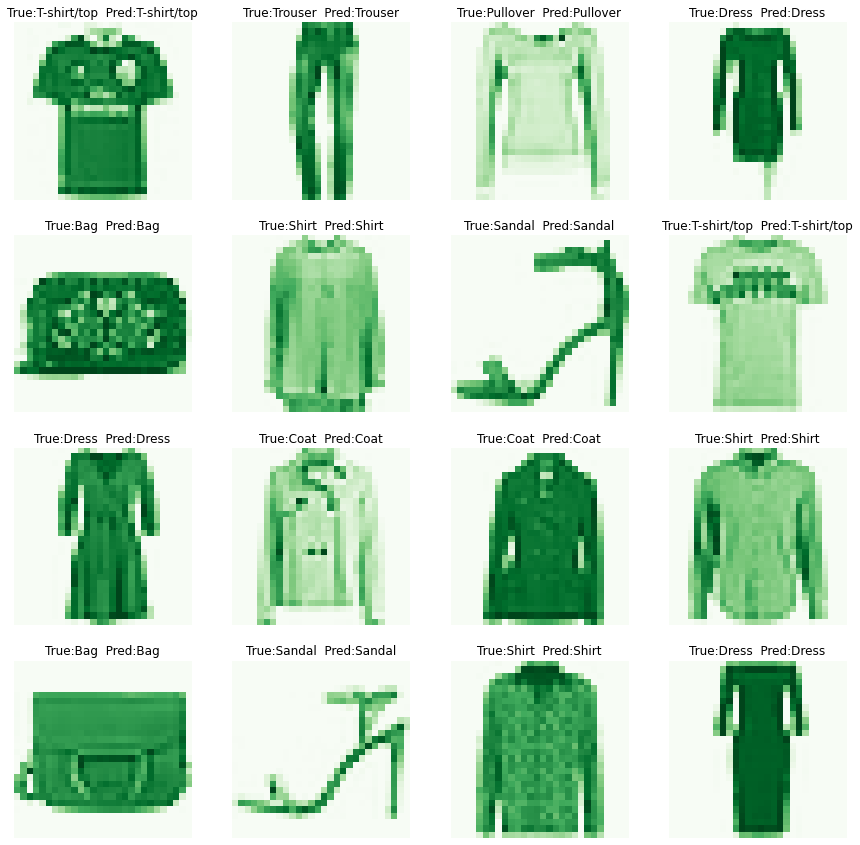

In [ ]:
def plot_images(data_index,cmap="Blues"):
    f, ax = plt.subplots(4,4, figsize=(15,15))

    for i, indx in enumerate(data_index[:16]):
        ax[i//4, i%4].imshow(X_test[indx].reshape(IMG_ROWS,IMG_COLS), cmap=cmap)
        ax[i//4, i%4].axis('off')
        ax[i//4, i%4].set_title("True:{}  Pred:{}".format(labels[y_true[indx]],labels[predicted_classes[indx]]))
    plt.show()    
    
plot_images(correct, "Greens")

In [ ]:
from sklearn.metrics import classification_report
target_names = ["Class {}".format(i) for i in range(10)]
print(classification_report(y_true, predicted_classes, target_names=target_names))

              precision    recall  f1-score   support

     Class 0       0.92      0.86      0.89      1000
     Class 1       0.99      0.99      0.99      1000
     Class 2       0.92      0.91      0.91      1000
     Class 3       0.91      0.97      0.94      1000
     Class 4       0.91      0.90      0.90      1000
     Class 5       0.99      0.98      0.98      1000
     Class 6       0.80      0.83      0.81      1000
     Class 7       0.94      0.99      0.96      1000
     Class 8       0.99      0.99      0.99      1000
     Class 9       0.99      0.95      0.97      1000

    accuracy                           0.94     10000
   macro avg       0.94      0.94      0.94     10000
weighted avg       0.94      0.94      0.94     10000



***Sample Feature Extraction***

In [ ]:
from keras.preprocessing import image

In [ ]:
feature_list = []
for x in X_train:
    
    img_array = image.img_to_array(x)
    img_array = np.expand_dims(img_array, axis=0)
    features = modelx.predict(img_array)
    feature_list.append(features)
    

In [ ]:
flt=np.array(feature_list)
flt=flt[:10000]

In [ ]:
flt

array([[[2.42415211e-07, 9.99994040e-01, 3.38581316e-07, ...,
         9.13824749e-08, 1.50218028e-07, 1.18657390e-07]],

       [[5.70273551e-06, 2.00979727e-07, 7.27623235e-03, ...,
         7.35639674e-08, 1.71098122e-07, 9.73711352e-08]],

       [[1.19586275e-05, 5.56606352e-08, 9.98267889e-01, ...,
         9.93093940e-10, 7.09657115e-08, 1.00866560e-09]],

       ...,

       [[3.39105433e-09, 6.23331360e-08, 2.46483634e-09, ...,
         6.93089314e-05, 1.05744832e-07, 9.99929309e-01]],

       [[9.59623685e-06, 5.31518474e-08, 9.98149276e-01, ...,
         8.36718361e-10, 6.49743725e-08, 8.97988073e-10]],

       [[9.51789379e-01, 1.21604694e-06, 5.86937356e-04, ...,
         5.88574256e-09, 2.22011454e-06, 1.25168320e-08]]], dtype=float32)

In [ ]:
x = image.load_img('/content/drive/MyDrive/shirt.jpg',target_size=(IMG_ROWS,IMG_COLS))
x = x.convert('L') 
img_array = image.img_to_array(x)
img_array = np.expand_dims(img_array, axis=0)


In [ ]:
from PIL import Image
img = Image.open('/content/drive/MyDrive/shirt.jpg')

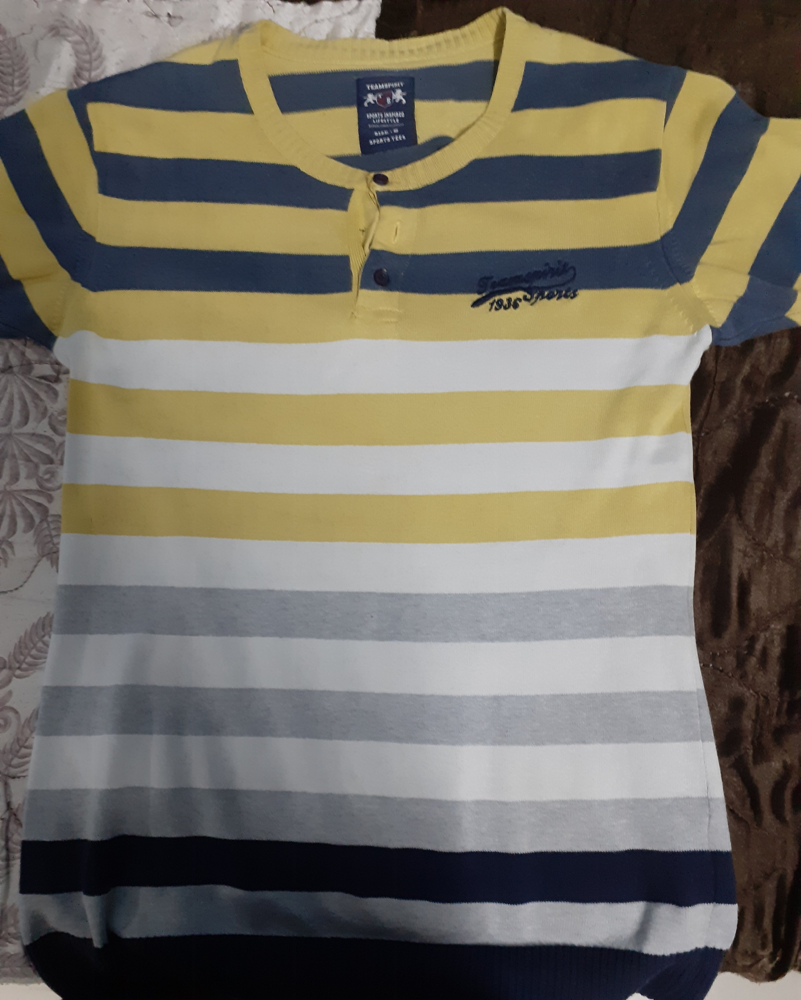

In [ ]:
img

In [ ]:
features = np.argmax(modelx.predict(img_array))

In [ ]:
features

6

In [ ]:

#flt1 = flt.reshape(flt.shape[0], (flt.shape[1]*flt.shape[2]))

***Saving and loading the trained model***

In [ ]:
nmodel.save('/content/drive/MyDrive/final_model.h5')

In [ ]:

from keras.models import load_model
modelx=load_model('/content/drive/MyDrive/final_model.h5')


In [ ]:
#modelx=load_model('/content/final_model.h5')